In [2]:

#crop the image

import cv2
import os

def crop_to_square(image_path, output_path):
    # Load the image
    image = cv2.imread(image_path)
    
    # Get the dimensions of the image
    height, width, _ = image.shape
    
    # Calculate the size of the square
    square_size = min(height, width)
    
    # Calculate the cropping coordinates
    start_x = (width - square_size) // 2
    start_y = (height - square_size) // 2
    
    # Crop the image to a square
    cropped_image = image[start_y:start_y + square_size, start_x:start_x + square_size]
    
    # Save the cropped image
    cv2.imwrite(output_path, cropped_image)

# Folder containing your images
input_folder = 'photos'
output_folder = 'save_cropped_images'

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Process each image in the folder
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(input_folder, filename)
        output_path = os.path.join(output_folder, filename)
        crop_to_square(input_path, output_path)

print("Cropping completed.")


Cropping completed.


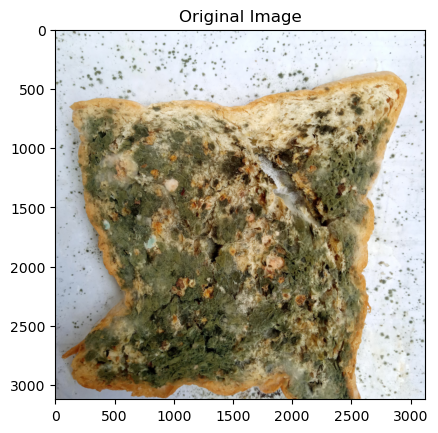

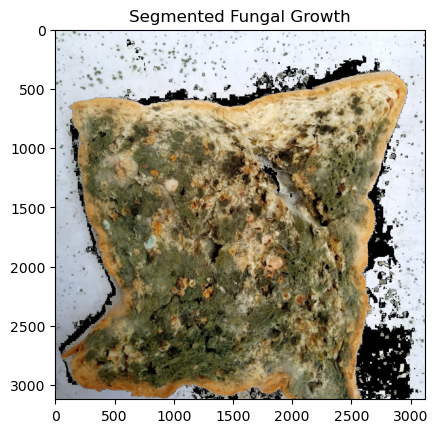

Processed and saved day10_evening.jpg to hsv_analysing\day10_evening.jpg


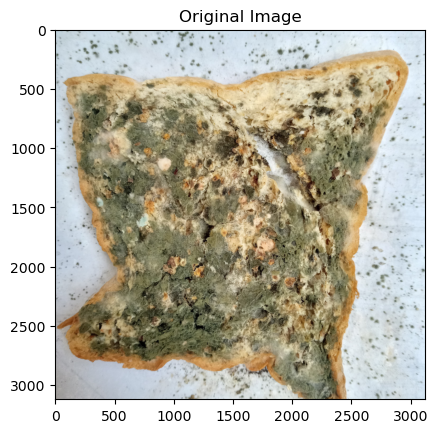

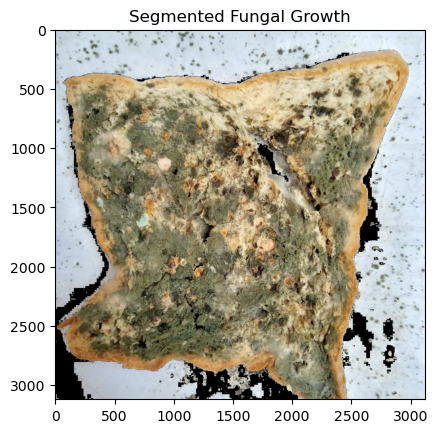

Processed and saved day10_morning.jpg to hsv_analysing\day10_morning.jpg


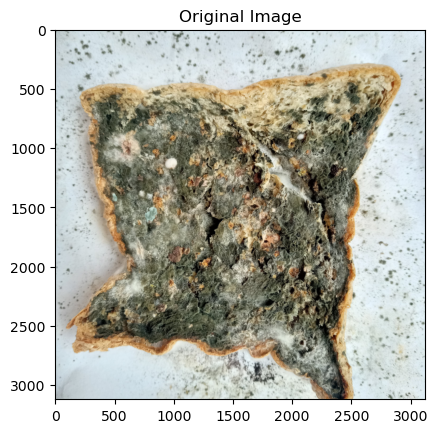

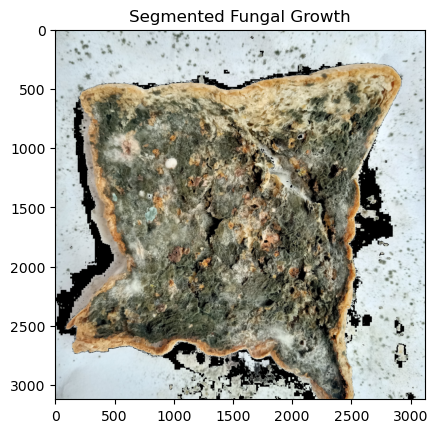

Processed and saved day11_evening.jpg to hsv_analysing\day11_evening.jpg


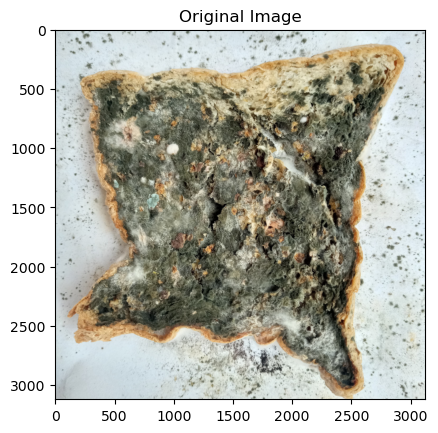

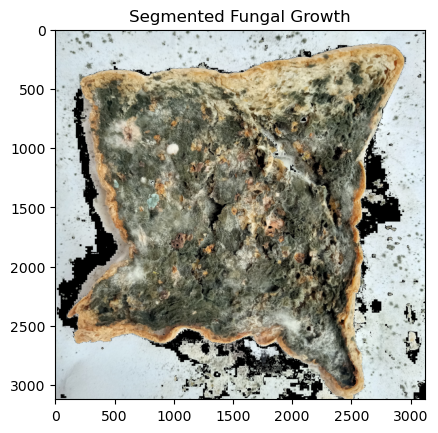

Processed and saved day11_morning.jpg to hsv_analysing\day11_morning.jpg


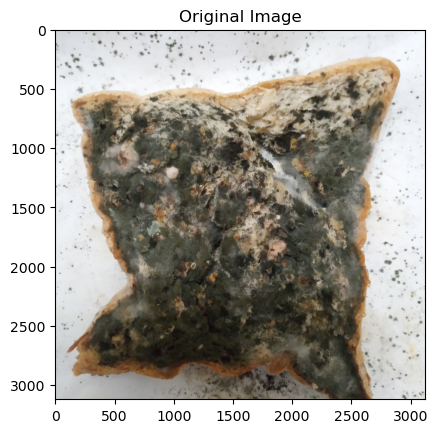

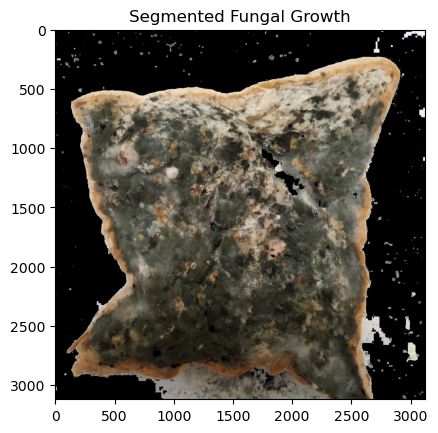

Processed and saved day12_evening.jpg to hsv_analysing\day12_evening.jpg


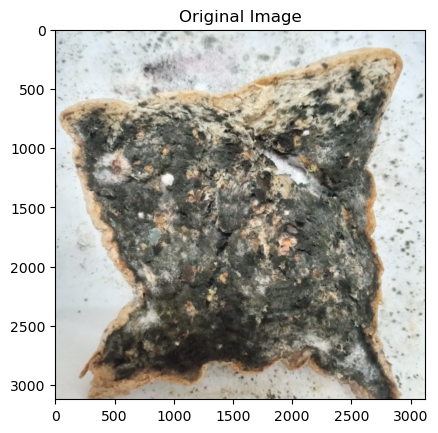

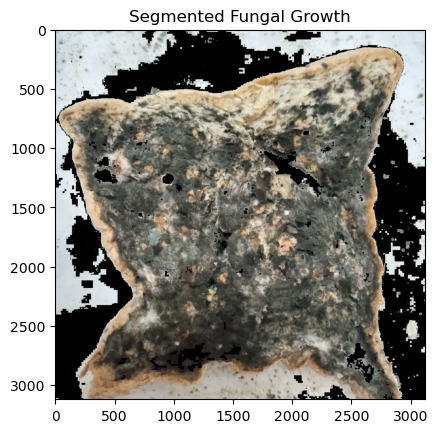

Processed and saved day12_morning.jpg to hsv_analysing\day12_morning.jpg


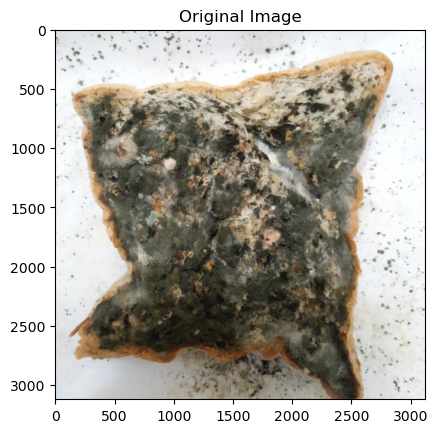

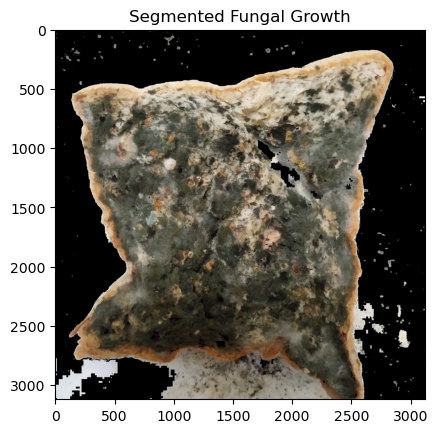

Processed and saved day13.jpg to hsv_analysing\day13.jpg


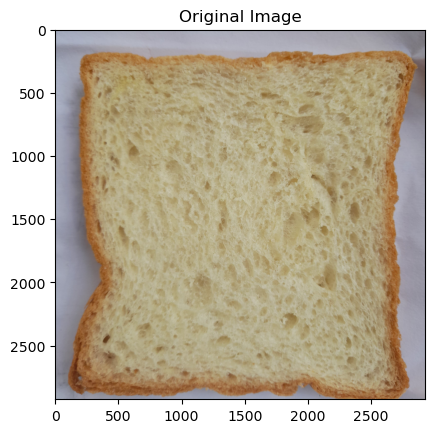

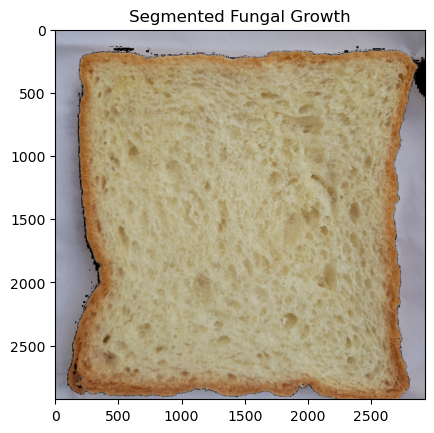

Processed and saved day1_evening.jpg to hsv_analysing\day1_evening.jpg


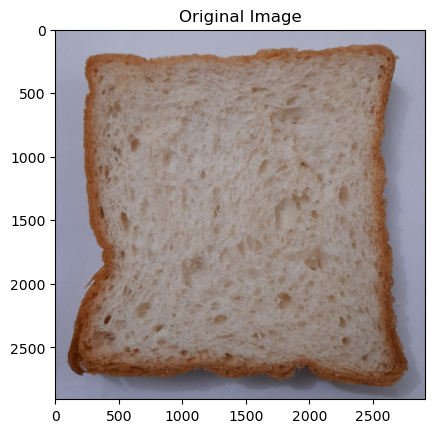

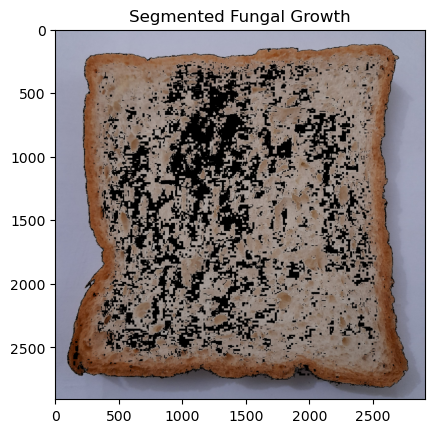

Processed and saved day1_morning.jpg to hsv_analysing\day1_morning.jpg


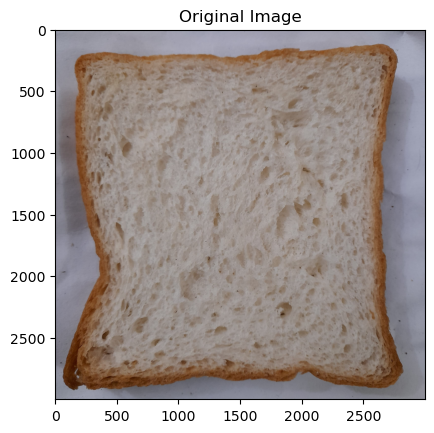

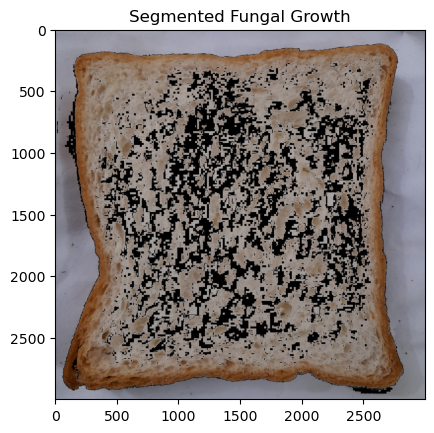

Processed and saved day2_evening.jpg to hsv_analysing\day2_evening.jpg


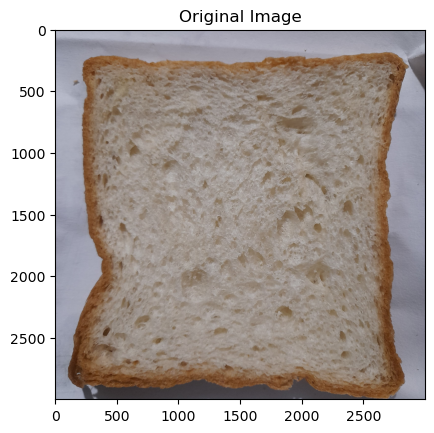

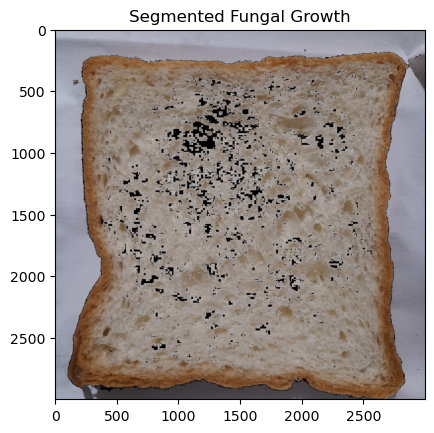

Processed and saved day2_morning.jpg to hsv_analysing\day2_morning.jpg


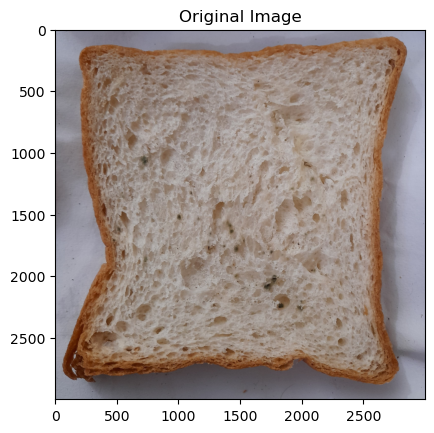

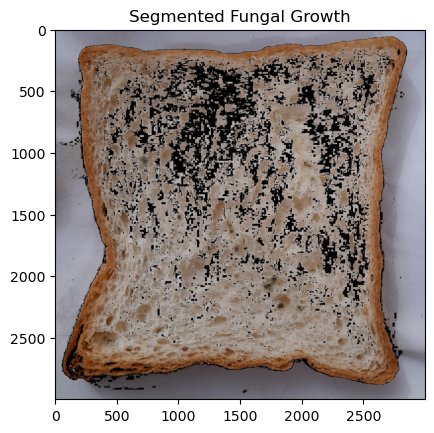

Processed and saved day3_evening.jpg to hsv_analysing\day3_evening.jpg


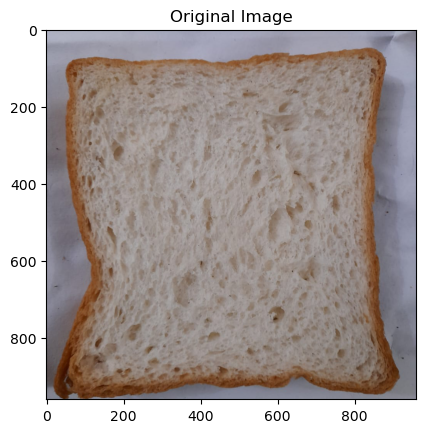

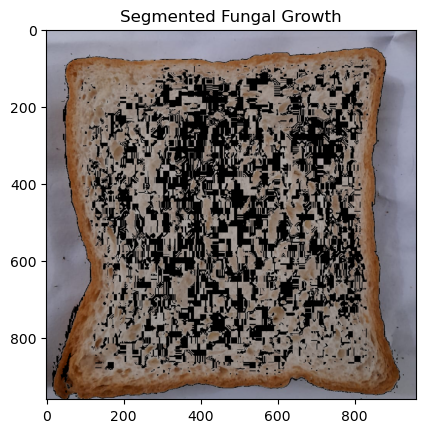

Processed and saved day3_morning.jpg to hsv_analysing\day3_morning.jpg


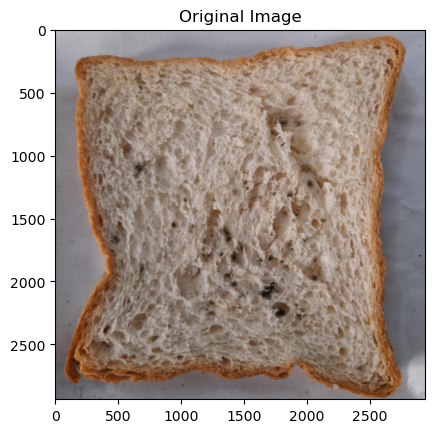

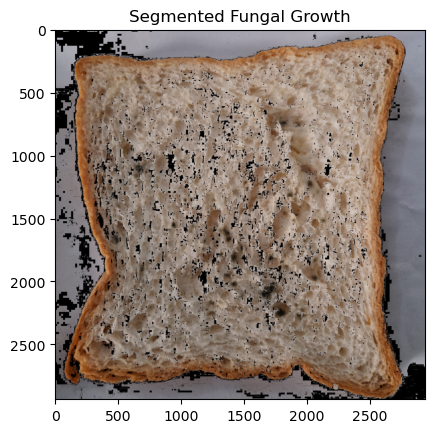

Processed and saved day4_evening.jpg to hsv_analysing\day4_evening.jpg


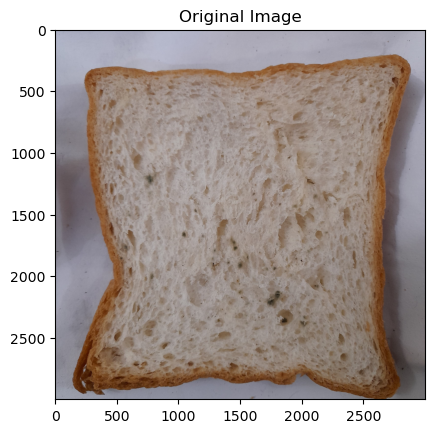

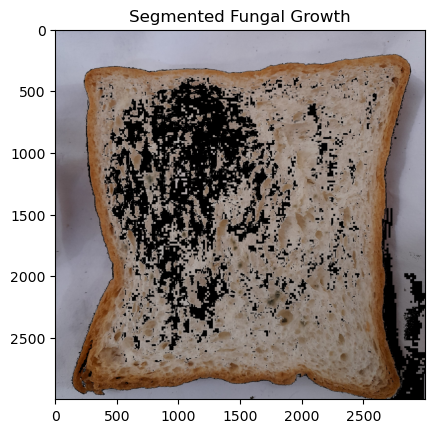

Processed and saved day4_morning.jpg to hsv_analysing\day4_morning.jpg


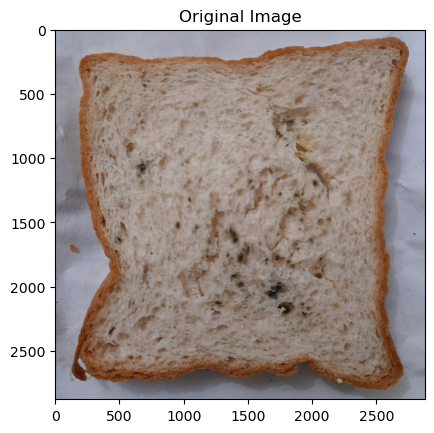

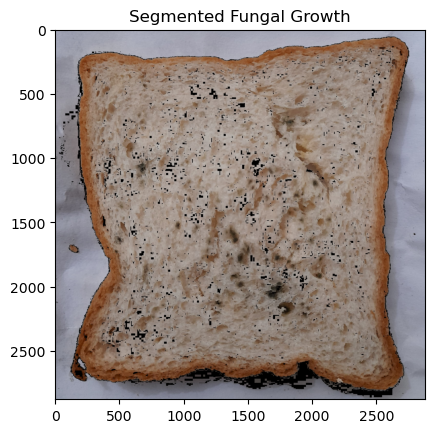

Processed and saved day5_evening.jpg to hsv_analysing\day5_evening.jpg


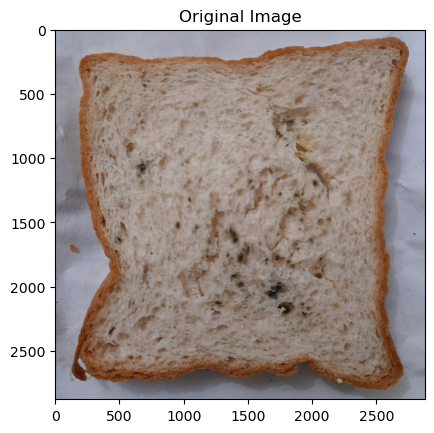

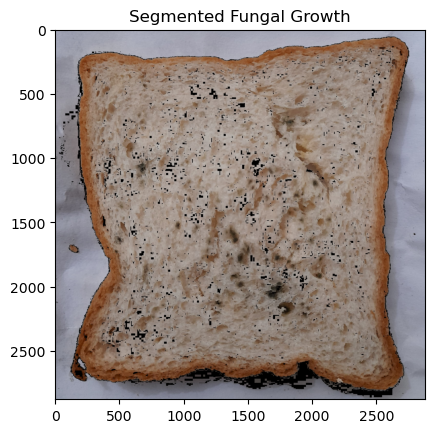

Processed and saved day5_morning.jpg to hsv_analysing\day5_morning.jpg


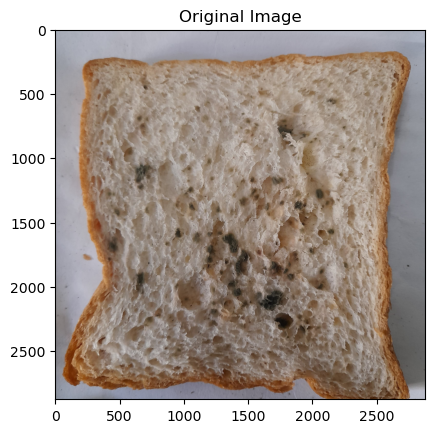

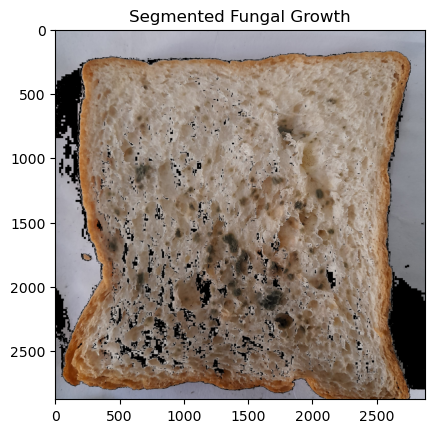

Processed and saved day6_evening.jpg to hsv_analysing\day6_evening.jpg


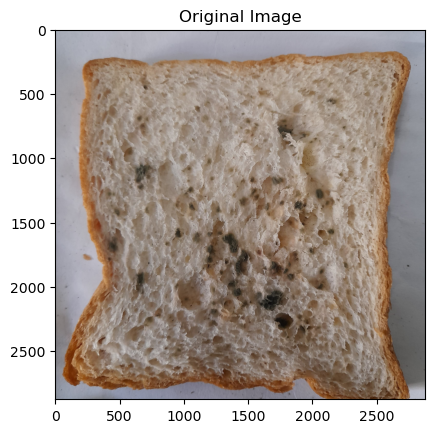

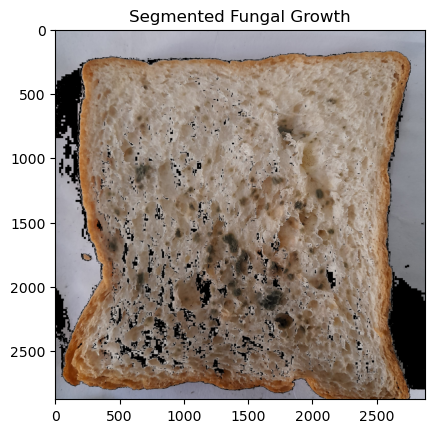

Processed and saved day6_morning.jpg to hsv_analysing\day6_morning.jpg


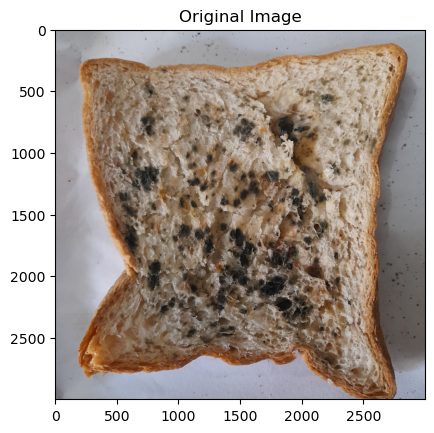

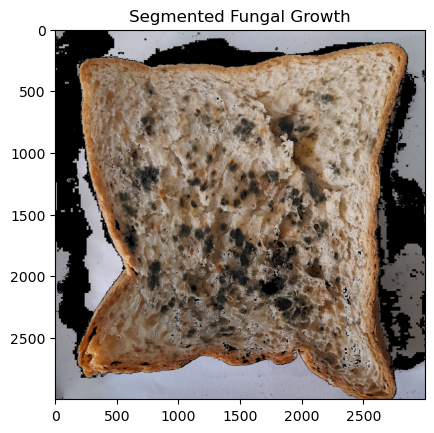

Processed and saved day7_evening.jpg to hsv_analysing\day7_evening.jpg


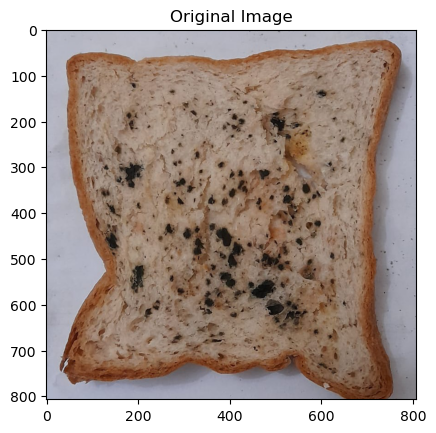

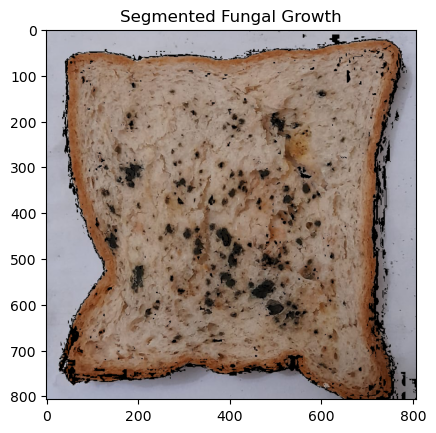

Processed and saved day7_morning.jpg to hsv_analysing\day7_morning.jpg


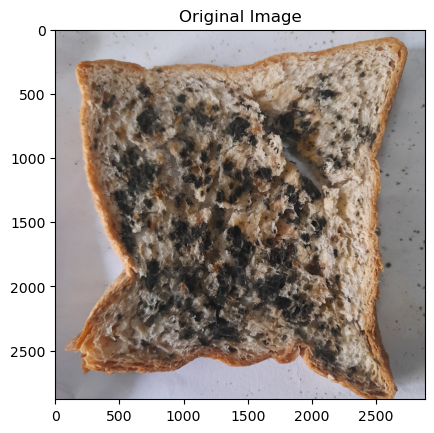

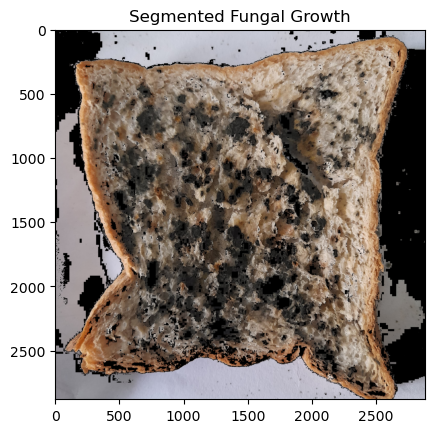

Processed and saved day8_evening.jpg to hsv_analysing\day8_evening.jpg


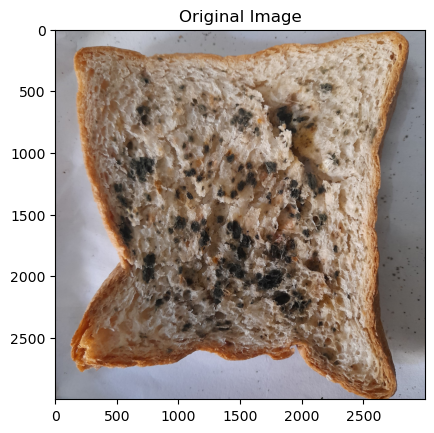

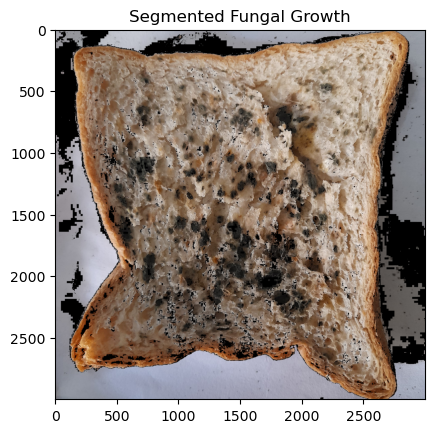

Processed and saved day8_morning.jpg to hsv_analysing\day8_morning.jpg


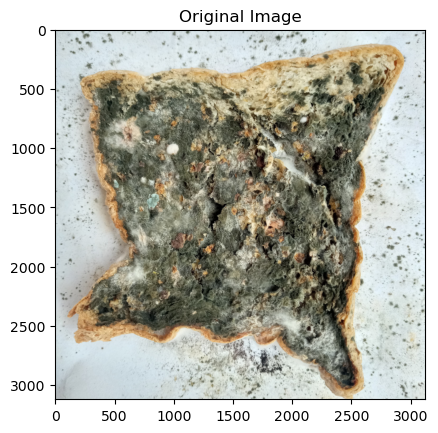

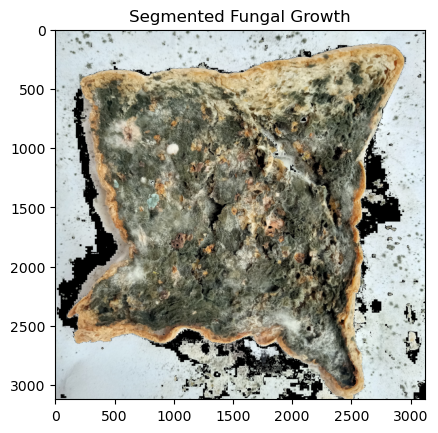

Processed and saved day9_evening.jpg to hsv_analysing\day9_evening.jpg


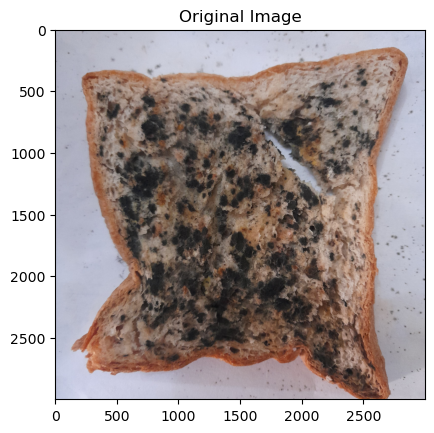

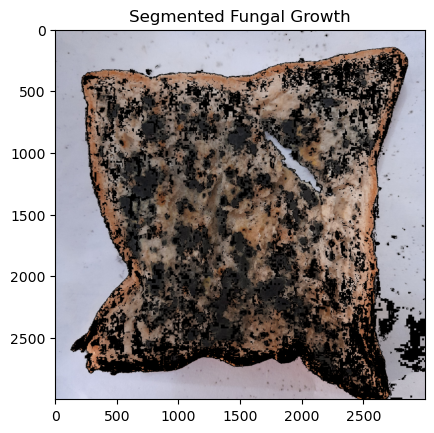

Processed and saved day9_morning.jpg to hsv_analysing\day9_morning.jpg


In [3]:
 # hsv analysing
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

def hsv_analyze_bread_slices(source_folder, output_folder):
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    for filename in os.listdir(source_folder):
        if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            filepath = os.path.join(source_folder, filename)
            
            # Read the image in RGB
            image = cv2.imread(filepath)
            if image is None:
                print(f"Failed to load image {filename}")
                continue
            
            # Convert the image from BGR to HSV
            hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
            
            # Display the original image
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.show()
            
            # Threshold the HSV image to segment fungal growth (tune these values as needed)
            lower_hsv = np.array([10, 10, 10])
            upper_hsv = np.array([255, 255, 255])
            mask = cv2.inRange(hsv_image, lower_hsv, upper_hsv)
            
            # Apply the mask to get the result
            result = cv2.bitwise_and(image, image, mask=mask)
            
            # Display the segmented result
            plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            plt.title('Segmented Fungal Growth')
            plt.show()
            
            # Construct the output file path
            output_path = os.path.join(output_folder, filename)
            
            # Save the segmented image
            cv2.imwrite(output_path, result)
            print(f"Processed and saved {filename} to {output_path}")

# Example usage
source_folder = 'save_cropped_images'
output_folder = 'hsv_analysing'

hsv_analyze_bread_slices(source_folder, output_folder)


In [5]:

#Brightness and contrast
import cv2
import numpy as np
import os

def adjust_brightness_contrast(image, alpha=1.0, beta=0):
    """
    Adjust the brightness and/or contrast of an image.
    Args:
        image: Input image
        alpha: Contrast control (1.0-3.0)
        beta: Brightness control (0-100)
    Returns:
        New image with adjusted brightness and contrast
    """
    new_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return new_image

def process_images(source_folder, output_folder, square_size=28, alpha=1.0, beta=0):
    """
    Process all images in the source folder and save the output to the output folder.
    Args:
        source_folder: Path to the source folder containing input images
        output_folder: Path to the output folder to save processed images
        square_size: Size of the square region to adjust
        alpha: Contrast control (1.0-3.0)
        beta: Brightness control (0-100)
    """
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in os.listdir(source_folder):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(source_folder, filename)
            image = cv2.imread(image_path)

            if image is None:
                continue

            # Get the center of the image
            h, w = image.shape[:2]
            center_x, center_y = w // 2, h // 2

            # Define the region of interest (ROI)
            x1 = max(center_x - square_size // 2, 0)
            y1 = max(center_y - square_size // 2, 0)
            x2 = min(center_x + square_size // 2, w)
            y2 = min(center_y + square_size // 2, h)

            roi = image[y1:y2, x1:x2]
            adjusted_roi = adjust_brightness_contrast(roi, alpha, beta)
            image[y1:y2, x1:x2] = adjusted_roi

            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, image)

# Paths to the source and output folders
source_folder = 'hsv_analysing'
output_folder = 'bright_contrast_image'

# Adjust the brightness and contrast of the central 28x28 square in all images
process_images(source_folder, output_folder, square_size=28, alpha=1.5, beta=50)


In [1]:
# contrast and draw histogram

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Paths
source_folder = 'bright_contrast_image'
output_folder = 'contrast'
histogram_folder = 'histo'

# Ensure output folders exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
if not os.path.exists(histogram_folder):
    os.makedirs(histogram_folder)

# Function to apply contrast stretching
def contrast_stretching(img):
    min_val, max_val = np.min(img), np.max(img)
    stretched_img = ((img - min_val) / (max_val - min_val)) * 255
    return stretched_img.astype(np.uint8)

# Function to plot histograms
def plot_histogram(img, title, output_path):
    plt.figure(figsize=(10, 5))
    plt.hist(img.ravel(), bins=256, range=(0, 256), color='gray')
    plt.title(title)
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.savefig(output_path)
    plt.close()

# Function to process images
def process_images(source_folder, output_folder, histogram_folder, region_size=(28, 28)):
    for filename in os.listdir(source_folder):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            img_path = os.path.join(source_folder, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            
            if img is not None:
                height, width = img.shape
                
                # Extract a 28x28 region from the center
                center_y, center_x = height // 2, width // 2
                half_region_h, half_region_w = region_size[0] // 2, region_size[1] // 2
                region = img[center_y - half_region_h:center_y + half_region_h, center_x - half_region_w:center_x + half_region_w]
                
                # Plot histogram for the original region
                plot_histogram(region, f'Original Histogram - {filename}', os.path.join(histogram_folder, f'{filename}.png'))
                
                # Apply contrast stretching to the region
                stretched_region = contrast_stretching(region)
                
                # Plot histogram for the stretched region
                plot_histogram(stretched_region, f'Contrast Stretched Histogram - {filename}', os.path.join(histogram_folder, f'stretched_histogram_{filename}.png'))
                
                # Place the processed region back into the image
                img[center_y - half_region_h:center_y + half_region_h, center_x - half_region_w:center_x + half_region_w] = stretched_region
                
                # Save the processed image
                output_path = os.path.join(output_folder, filename)
                cv2.imwrite(output_path, img)

# Apply the function
process_images(source_folder, output_folder, histogram_folder)

print("Processing and histogram generation complete!")


Processing and histogram generation complete!


In [1]:
# gussion smoothing

import os
import cv2
import numpy as np

# Paths
source_folder = 'contrast'
output_folder = 'gaussion_smoothing'

# Ensure output folder exists
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Function to apply Gaussian smoothing
def gaussian_smoothing(img, kernel_size=(5, 5)):
    smoothed_img = cv2.GaussianBlur(img, kernel_size, 0)
    return smoothed_img

# Function to process images
def process_images(source_folder, output_folder, region_size=(28, 28), kernel_size=(5, 5)):
    for filename in os.listdir(source_folder):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            img_path = os.path.join(source_folder, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            
            if img is not None:
                height, width = img.shape
                
                # Extract a 28x28 region from the center
                center_y, center_x = height // 2, width // 2
                half_region_h, half_region_w = region_size[0] // 2, region_size[1] // 2
                region = img[center_y - half_region_h:center_y + half_region_h, center_x - half_region_w:center_x + half_region_w]
                
                # Apply Gaussian smoothing to the region
                smoothed_region = gaussian_smoothing(region, kernel_size)
                
                # Place the smoothed region back into the image
                img[center_y - half_region_h:center_y + half_region_h, center_x - half_region_w:center_x + half_region_w] = smoothed_region
                
                # Save the processed image
                output_path = os.path.join(output_folder, filename)
                cv2.imwrite(output_path, img)

# Apply the function
process_images(source_folder, output_folder)

print("Gaussian smoothing processing complete!")



Gaussian smoothing processing complete!
